# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

Решил на 3.5 балла - сохранил время, нервы, сон

In [52]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans, DBSCAN


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        D = np.diag(X.sum(axis=1))
        L = D - X
        eignvalues, eignvectors = np.linalg.eigh(L)
        asc_order = np.argsort(eignvalues)[:self.n_components]
        return eignvectors[:, asc_order]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [54]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [55]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
# Для большего удобства я взял 0..n индексы вместо исходных, потому что все равно есть уникальный ID_en
data = data.reset_index(drop=True).reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,0,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,1,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,2,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,3,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,4,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [56]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [57]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes_data = data[['index', 'RouteNumbers_en']].copy()
    routes_data['RouteNumbers_en'] = routes_data['RouteNumbers_en'].apply(lambda x: x.split('; '))
    routes_data = routes_data.explode('RouteNumbers_en').groupby('RouteNumbers_en')['index'].apply(list)
    routes = routes_data.to_dict()
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    longitudes = np.array(data['Longitude_WGS84_en'])
    latitudes = np.array(data['Latitude_WGS84_en'])
    routes_sorted = dict()

    for (route, stops) in routes.items():
        left_stops = stops.copy()
        stops_sorted = list()

        route_longitudes = longitudes[left_stops]
        route_latitudes = latitudes[left_stops]

        pairwise_dist = np.sqrt((route_longitudes[:, np.newaxis] - route_longitudes[np.newaxis, :]) ** 2 + (route_latitudes[:, np.newaxis] - route_latitudes[np.newaxis, :]) ** 2)
        next_stop_ind = np.argmax(pairwise_dist.sum(axis=1))
        stops_sorted.append(left_stops[next_stop_ind])
        left_stops.remove(left_stops[next_stop_ind])

        for i in range(len(stops) - 1):
            stop_lon, stop_lat = route_longitudes[next_stop_ind], route_latitudes[next_stop_ind]

            route_longitudes = longitudes[left_stops]
            route_latitudes = latitudes[left_stops]

            distances = np.sqrt((route_longitudes - stop_lon) ** 2 + (route_latitudes - stop_lat) ** 2)
            next_stop_ind = np.argmin(distances)
            stops_sorted.append(left_stops[next_stop_ind])
            left_stops.remove(left_stops[next_stop_ind])

        routes_sorted[route] = stops_sorted.copy()
    return routes_sorted


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    X = np.zeros((data.shape[0], data.shape[0]))
    for (route, stops) in sorted_routes.items():
        for i in range(len(stops) - 1):
            stop_a = stops[i],
            stop_b = stops[i + 1]
            X[stop_a, stop_b] += 1
            X[stop_b, stop_a] += 1
    return X

In [58]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [59]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=3):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [60]:
from matplotlib import colormaps as cm
from matplotlib import colors

# Это была самая сложная строчка этой домашки
colors = [colors.rgb2hex(cm.get_cmap('Dark2')(i)) for i in range(10)] +\
         [colors.rgb2hex(cm.get_cmap('tab20b')(i)) for i in range(20)] +\
         [colors.rgb2hex(cm.get_cmap('tab20')(i)) for i in range(20)] +\
         [colors.rgb2hex(cm.get_cmap('Set3')(i)) for i in range(10)] +\
         [colors.rgb2hex(cm.get_cmap('Set1')(i)) for i in range(10)]


def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                    radius=10, color=colors[labels[id]]).add_to(map)
    return map

draw_clustered_map(data, labels=np.ones(data.shape[0], dtype=int))

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [61]:
X = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']]
kmeans = KMeans(n_clusters=17).fit(X)
draw_clustered_map(X, kmeans.predict(X))

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [62]:
X = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']]
dbscan = DBSCAN(eps=3e-3).fit(X)
draw_clustered_map(X, dbscan.labels_)

In [67]:
predictions = GraphClustering(n_clusters=35, n_components=15).fit_predict(adjacency_matrix)
draw_clustered_map(data, predictions)

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

**KMeans:** Разбивает остановки по географическому признаку - по сути по районам, потому что так он устроен по определению. Не могу придумать, для чего такая кластеризация остановок может пригодится - возможно, для расклейки предвыборных плакатов, хотя и там можно использовать готовые географические районы Москвы.

**BSCAN:** Выделяет области с высокой плотностью маршруток - кластеров аж 63 и некоторые очень маленькие. Такой метод может пригодится, если хочется соптимизировать число остановок - тогда можно для каждого кластера посчитать метрику внутрикластерного расстояния и понять, в каких местах есть "лишние остановки". По выбросам можно наоборот понять, где остановок не хватает и людям приходится много ходить.

**Спектральная кластеризация:** Буквально ищем компоненты связности в графе и выделяем точки, между которыми легко добираться (не только есть путь между остановками, но еще скорее всего и несколько маршрутов, что снижает время ожидания автобуса). Видно, что расстояние между остановками не имеет никакого значения - две соседние могут относиться к разными кластерам, а еще кластера могут пересекать друг друга географически. Этот подход, вероятно, самый "адекватный", но как говорится "какую задачу вы решаете?". Чем больше кластеров мы здесь берем, тем более строгие требования на достижимость и доступность мы накладываем. Маленькие кластеры соответствуют не очень хорошей ситуации - из них тяжелее доехать в другие места. 

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [3]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [4]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [5]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/daniilvolodin/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/daniilvolodin/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/daniilvolodin/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [7]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [8]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

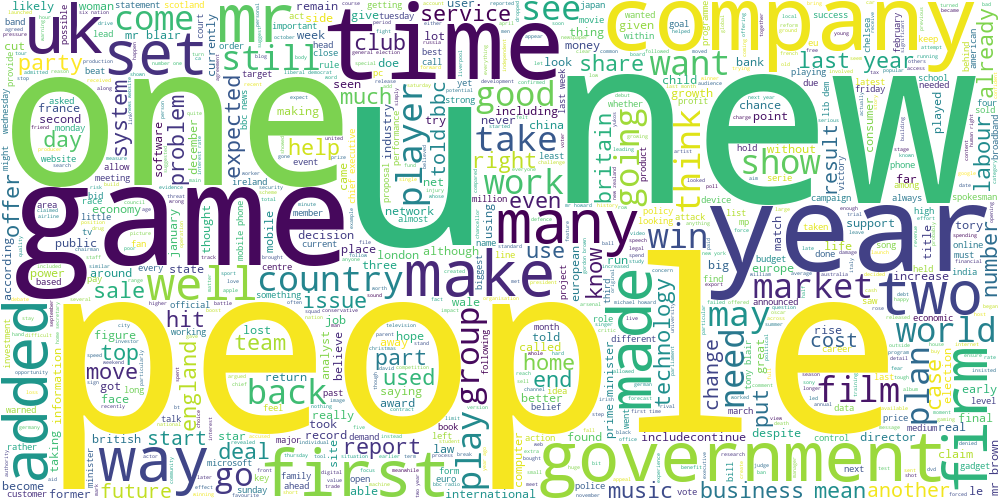

In [12]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** Да, очень интерпретируемые

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer

tf_idf = TfidfVectorizer(min_df=4).fit(data['text'])
X_tf_idf = tf_idf.transform(data['text'])
kmeans = KMeans(n_clusters=8).fit(X_tf_idf)

labels = kmeans.predict(X_tf_idf)

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


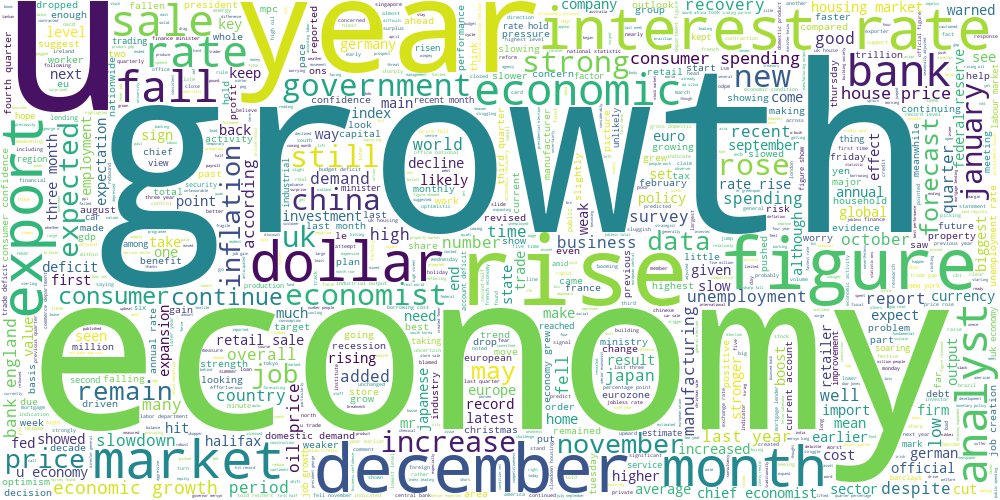

In [14]:
draw_wordcloud(data[labels == 0].text)
# Макроэкономика

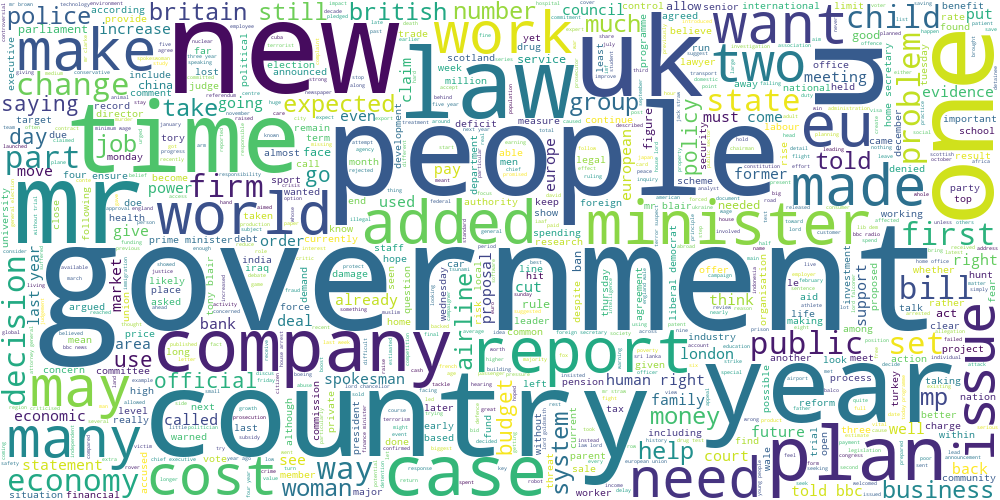

In [15]:
draw_wordcloud(data[labels == 1].text)
# Социальная/Государственная политика

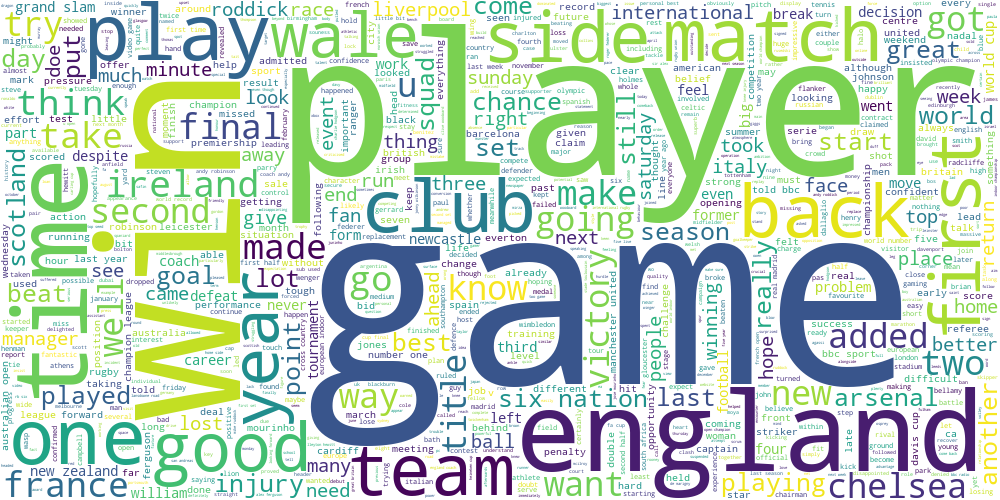

In [16]:
draw_wordcloud(data[labels == 2].text)
# Футбооооол, в датасет как будто много текстов с ЧЕ 2004 попало

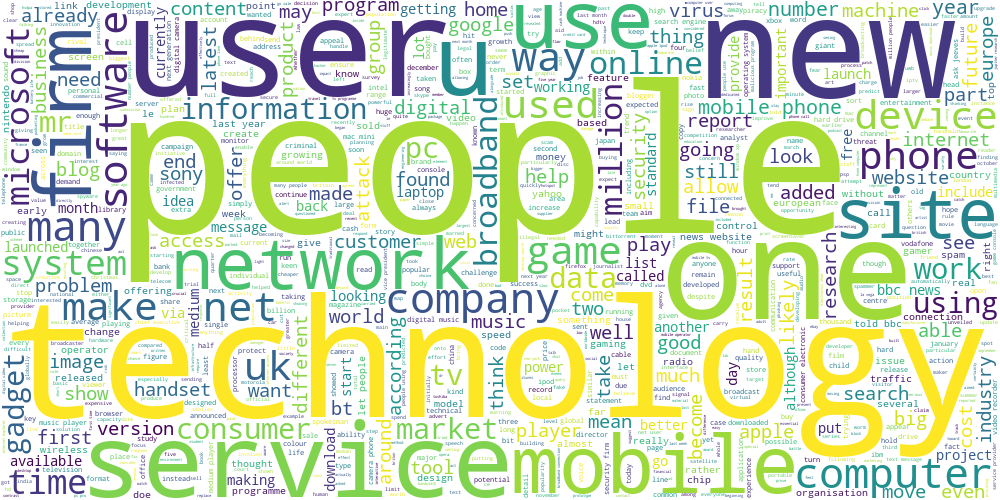

In [17]:
draw_wordcloud(data[labels == 3].text)
# Цифровые технологии

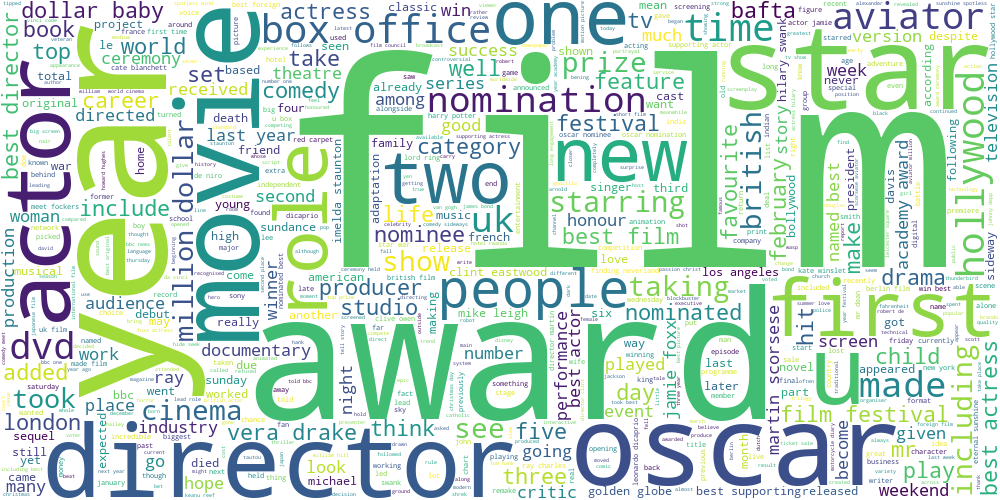

In [18]:
draw_wordcloud(data[labels == 4].text)
# Кино

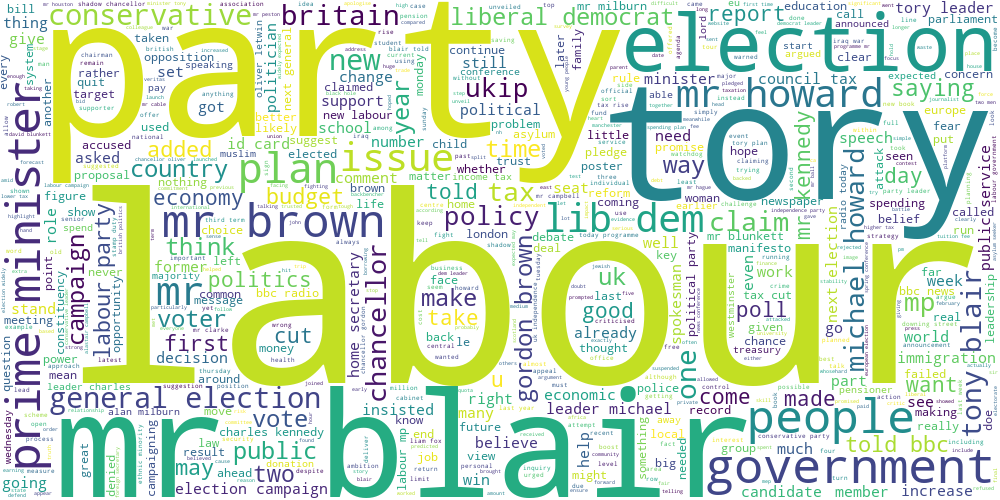

In [19]:
draw_wordcloud(data[labels == 5].text)
# Политика/Выборы

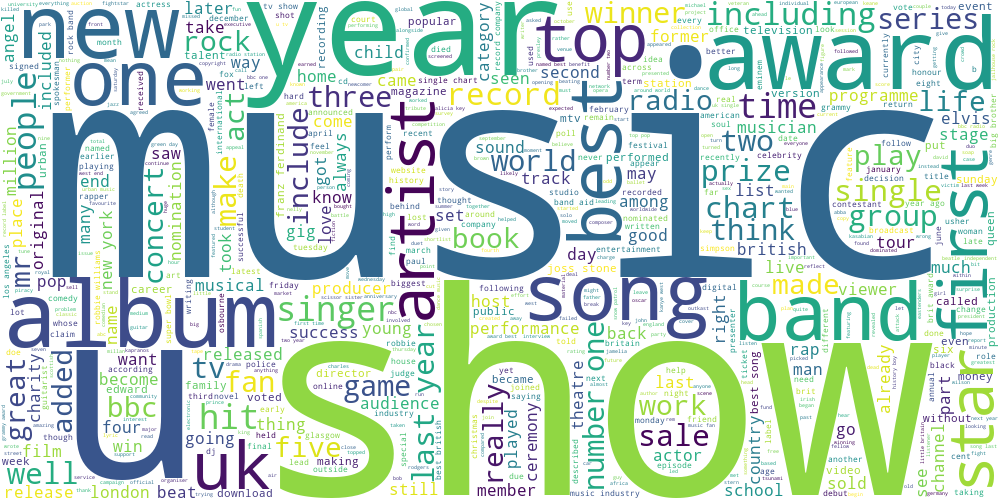

In [20]:
draw_wordcloud(data[labels == 6].text)
# Музыка

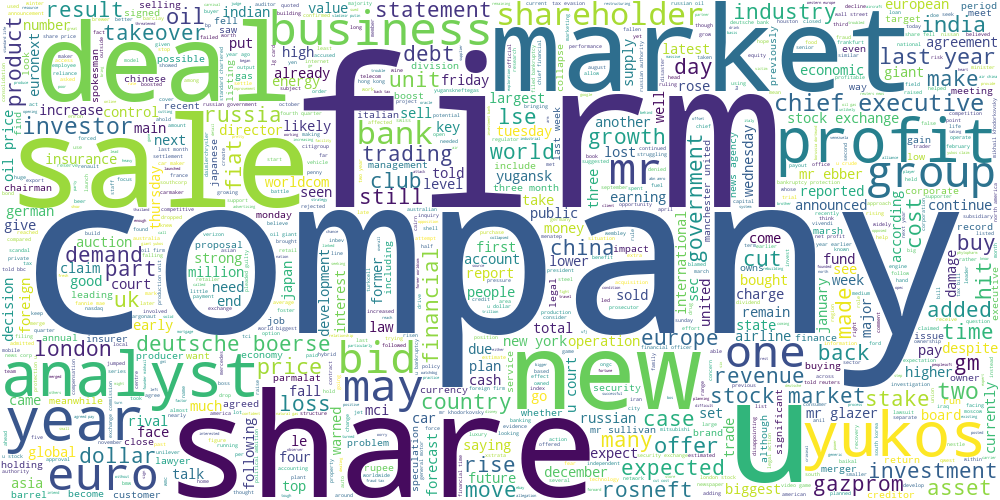

In [21]:
draw_wordcloud(data[labels == 7].text)
# Бизнес

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Да, все очень четко согласуется

In [50]:
top_words = kmeans.cluster_centers_.argsort(axis=1)[:, ::-1][:, :5]
top_words = tf_idf.get_feature_names_out()[top_words]

for label in range(max(labels) + 1):
    print(f'Topic {label + 1}: {" ".join(top_words[label])}')

Topic 1: growth economy rate price figure
Topic 2: mr government would country lord
Topic 3: game england player win match
Topic 4: mobile phone people technology user
Topic 5: film award oscar best actor
Topic 6: mr labour election party blair
Topic 7: music show band album award
Topic 8: company firm share profit market


**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [110]:
from sklearn.cluster import SpectralClustering

kmeans = KMeans(n_clusters=8)
labels_kmeans = kmeans.fit_predict(X_tf_idf)

spectral = SpectralClustering(n_clusters=8)
labels_spectral = spectral.fit_predict(X_tf_idf)

dbscan = DBSCAN(eps=0.85)
labels_dbscan = dbscan.fit_predict(X_tf_idf)


/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [111]:
max(dbscan.labels_) + 1

8

In [103]:
from sklearn.manifold import TSNE

tsne_embeds = TSNE().fit_transform(X_tf_idf.toarray())

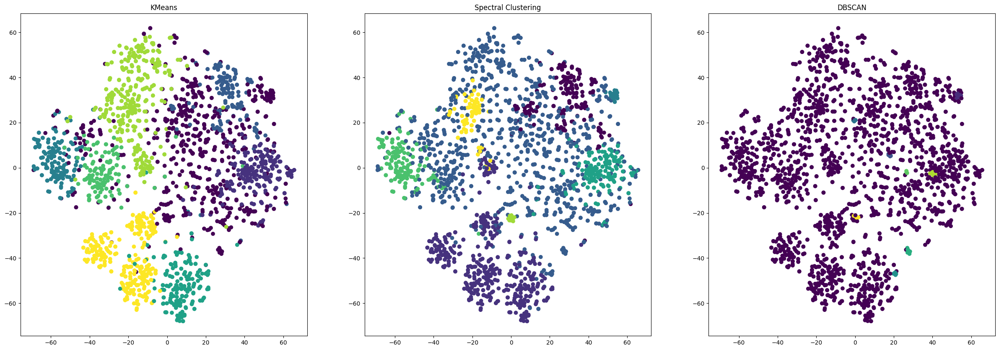

In [120]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(30, 10))

ax[0].scatter(x=tsne_embeds[:, 0], y=tsne_embeds[:, 1], c=labels_kmeans)
ax[0].set_title('KMeans')

ax[1].scatter(x=tsne_embeds[:, 0], y=tsne_embeds[:, 1], c=labels_spectral)
ax[1].set_title('Spectral Clustering')

ax[2].scatter(x=tsne_embeds[:, 0], y=tsne_embeds[:, 1], c=labels_dbscan)
ax[2].set_title('DBSCAN')

plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

**KMeans:** Размеры кластеров получились сбалансированными - нет супер больших и совсем маленьких с единичными представителями (что является аномалией в нашей задаче - кластер из 3 текстов говорит о том, что тема слишком узкая). Тексты кластеризовались кучками - скорее всего в их векторах представлений одинаковые слова имеют схожие значения tf_idf

**Spectral Clustering:** Баланс похуже: есть огромный кластер, распространившийся на всю плоскость. Возможно, это клишированные тексты, в которых наше спектральное приближение построило связи между словами-клише или просто частотными фразами, которые мы видели выше: люди, u, one, two, etc. Но с другой стороны, выделились и похожие на kmeans небольшие кластеры.

**DBSCAN:** Без слез не взглянешь и комментарии излишне. Так как мы взяли всего 8 кластеров, то он выделил супер узкие темы, а все остальное попало в 1 кластер - это скорее свидетельствует о том, что тексты новостей - это не сочинение на егэ по англйскому под копирку, поэтому и скученности буквально по словам здесь быть не может.

По принципу разбиения полученные кластеризации вполне соотносятся с географическими данными, однако визуализации и выбор кластеризации - конечно же, нет, а дело все в том, с какими данными мы работает и какая между ними взаимосвязь (ну и как эмбеддинги строим, конечно же :) )

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** базово достаточно брать argmax - наиболее вероятную тему. Кластеры и вправду стали обладать более узкими темами, однако также добавилось и много мусора. Предполагаю, что способ объединения стоит брать другой - хочется учитывать сразу несколько тем (топ-3, например), потому что среди текущих 24х могут быть какие-то частотные не темы, а скорее наборы клише, из которых берутся эти вечные слова people, u, new, year - а мы считаем, что это целая тема текста.

In [122]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

bow = CountVectorizer()
X_bow = bow.fit_transform(data.text)

lda = LatentDirichletAllocation(n_components=24)
labels_lda = lda.fit_transform(X_bow).argmax(axis=1)

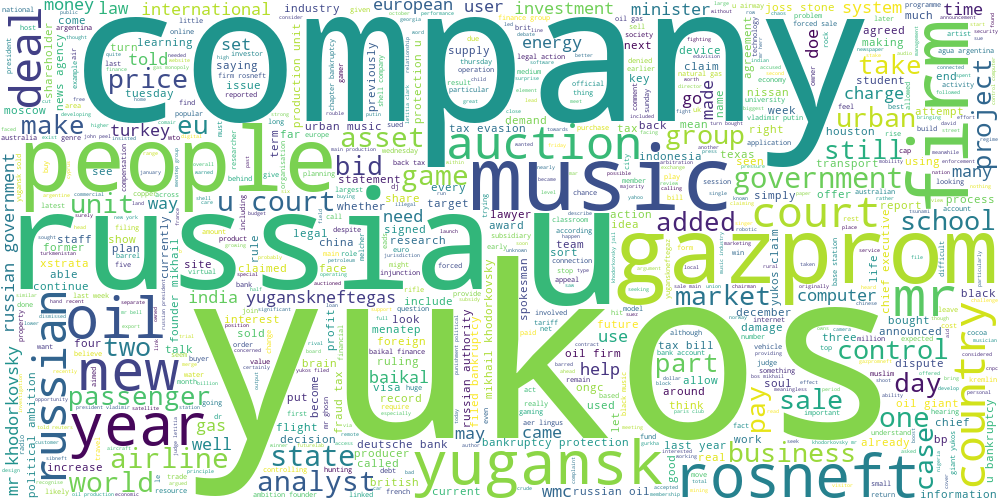

In [123]:
draw_wordcloud(data[labels_lda == 0].text)
# Нефтегазовая отрасль - очень сильное сужение

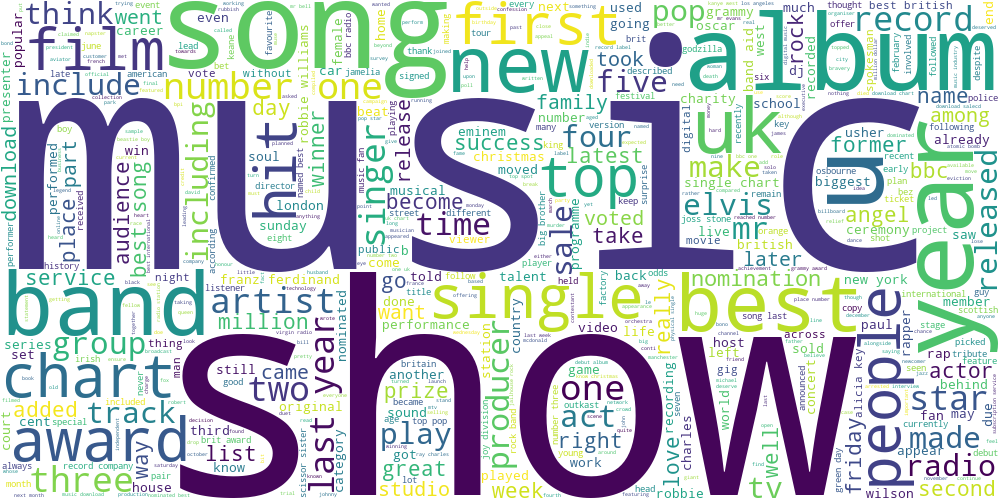

In [125]:
draw_wordcloud(data[labels_lda == 2].text)
# Музыка - класс не стал уже, но тексты выделились значительно точнее, отчего в словах меньше шума и очень много попаданий

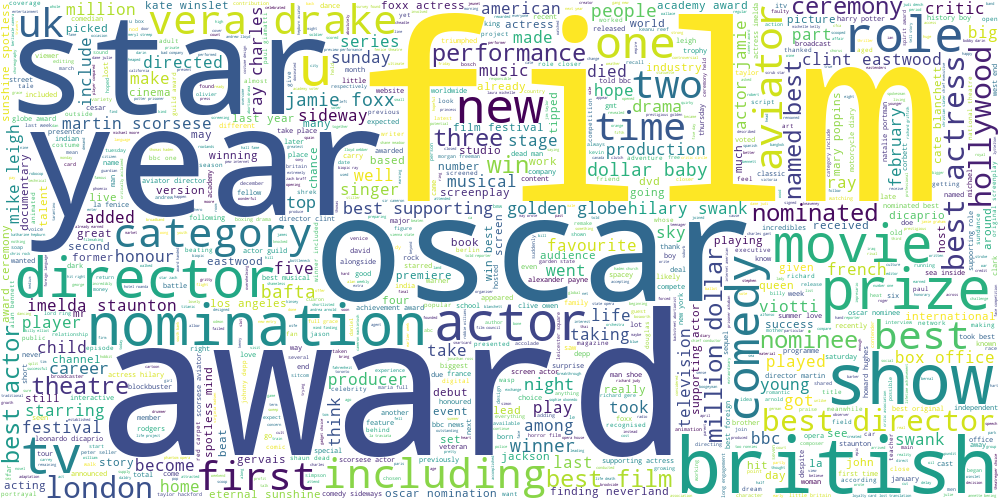

In [135]:
draw_wordcloud(data[labels_lda == 12].text)
# Кинофильмы - стало точнее

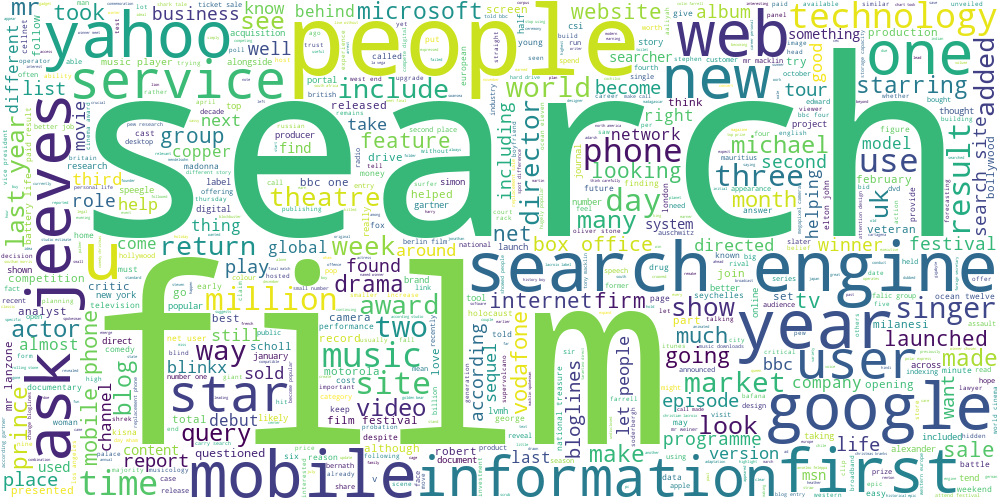

In [136]:
draw_wordcloud(data[labels_lda == 13].text)
# Поисковые технологии - сужение темы цифровых технологий

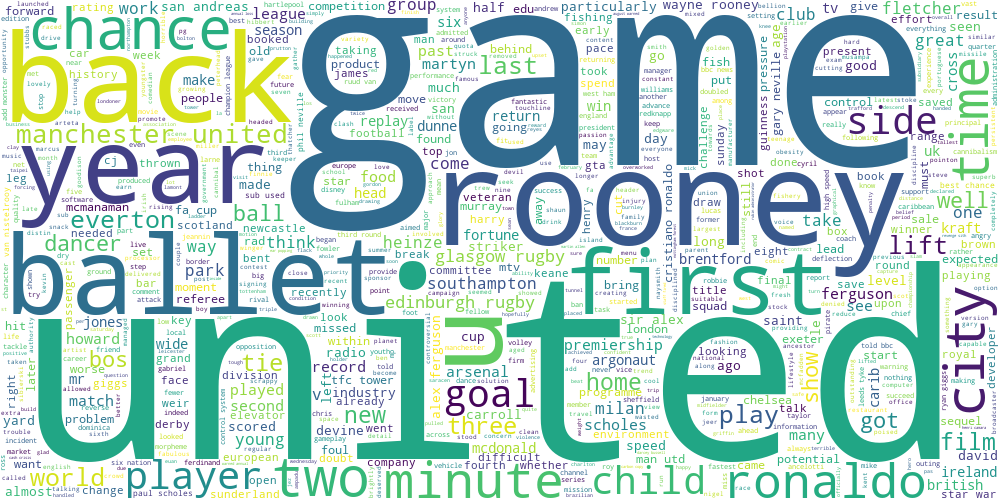

In [137]:
draw_wordcloud(data[labels_lda == 14].text)
# Это очень интересный пример - АПЛ и звезды тех времен, которые выделились в словах: Юнайтед (Манчестер), Руни и Роналду

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(data.text, data.category, test_size=0.25, random_state=42)

In [14]:
tf_idf = TfidfVectorizer()
X_train_tf_idf = tf_idf.fit_transform(X_train)
X_test_tf_idf = tf_idf.transform(X_test)

#### Логистическая регрессия на tf-idf признаках

In [19]:
from sklearn.linear_model import LogisticRegression

log_reg_tf_idf = LogisticRegression()
log_reg_tf_idf.fit(X_train_tf_idf, y_train)

print(f"Train accuracy: {accuracy_score(y_train, log_reg_tf_idf.predict(X_train_tf_idf))}")
print(f"Test accuracy: {accuracy_score(y_test, log_reg_tf_idf.predict(X_test_tf_idf))}")

Train accuracy: 0.9982014388489209
Test accuracy: 0.9694793536804309


#### K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

In [32]:
kmeans = KMeans(n_clusters=6) # Иначе не сходится fit
kmeans.fit(X_train_tf_idf)

X_train_kmeans = kmeans.transform(X_train_tf_idf)
X_test_kmeans = kmeans.transform(X_test_tf_idf)

log_reg_kmeans = LogisticRegression()
log_reg_kmeans.fit(X_train_kmeans, y_train)

print(f"Train accuracy: {accuracy_score(y_train, log_reg_kmeans.predict(X_train_kmeans))}")
print(f"Test accuracy: {accuracy_score(y_test, log_reg_kmeans.predict(X_test_kmeans))}")

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Train accuracy: 0.8087529976019184
Test accuracy: 0.7666068222621185


#### Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

In [28]:
bow = CountVectorizer()
X_train_bow = bow.fit_transform(X_train)
X_test_bow = bow.transform(X_test)

lda = LatentDirichletAllocation(n_components=24)
X_train_lda = lda.fit_transform(X_train_bow)
X_test_lda = lda.transform(X_test_bow)

log_reg_lda = LogisticRegression()
log_reg_lda.fit(X_train_lda, y_train)

print(f"Train accuracy: {accuracy_score(y_train, log_reg_lda.predict(X_train_lda))}")
print(f"Test accuracy: {accuracy_score(y_test, log_reg_lda.predict(X_test_lda))}")

Train accuracy: 0.8908872901678657
Test accuracy: 0.9281867145421903


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Лучше всего - логрег на tf-idf. Связано это с тем, что методы с kmeans и lda производят сначала сжатие данных и информация теряется. При этом KMeans был совсем плох - вероятно, потому что неверный выбор центров кластеров влечет за собой большое количество шума в данных (выбросов), при том что сжатие до вероятностей тем вообще говоря логичное и должно сохранять много информации для классификации. Это по сути то, о чем я говорил в пункте про LDA - хочется брать не argmax тему, а как то выбирать из топа/компоновать вместе - логрег по сути это и делает.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [38]:
X_train_full, X_valid, y_train_full, y_valid = train_test_split(X_train, y_train, test_size=0.3, random_state=42)
X_train_labeled, X_train_unlabeled, y_train_labeled, y_train_unlabeled = train_test_split(X_train_full, y_train_full, test_size=0.714, random_state=42)

#### Логистическая регрессия на tf-idf признаках

In [62]:
import optuna

def objective(trial):
    # TF-IDF hyperparameters
    min_df =  trial.suggest_int('min_df', 1, 11, step=2)

    # LogReg hyperparameters
    C = trial.suggest_float('C', 1e-1, 100, log=True)

    tf_idf = TfidfVectorizer(min_df=min_df)
    log_reg = LogisticRegression(C=C)

    tf_idf.fit(X_train_full)

    X_train_labeled_tf_idf = tf_idf.transform(X_train_labeled)
    log_reg.fit(X_train_labeled_tf_idf, y_train_labeled)

    X_valid_tf_idf = tf_idf.transform(X_valid)
    score = accuracy_score(y_valid, log_reg.predict(X_valid_tf_idf))
    return score    

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2024-04-22 05:30:56,370] A new study created in memory with name: no-name-54b6c925-ba37-4578-b298-67906221303b


[I 2024-04-22 05:30:56,755] Trial 0 finished with value: 0.874251497005988 and parameters: {'min_df': 7, 'C': 0.3644933652133196}. Best is trial 0 with value: 0.874251497005988.
[I 2024-04-22 05:30:57,145] Trial 1 finished with value: 0.9540918163672655 and parameters: {'min_df': 11, 'C': 3.424112713144557}. Best is trial 1 with value: 0.9540918163672655.
[I 2024-04-22 05:30:58,424] Trial 2 finished with value: 0.9600798403193613 and parameters: {'min_df': 1, 'C': 38.052584940980765}. Best is trial 2 with value: 0.9600798403193613.
[I 2024-04-22 05:30:59,072] Trial 3 finished with value: 0.9600798403193613 and parameters: {'min_df': 3, 'C': 16.065455938856854}. Best is trial 2 with value: 0.9600798403193613.
[I 2024-04-22 05:30:59,619] Trial 4 finished with value: 0.9600798403193613 and parameters: {'min_df': 3, 'C': 9.692431727884737}. Best is trial 2 with value: 0.9600798403193613.
[I 2024-04-22 05:31:00,700] Trial 5 finished with value: 0.9600798403193613 and parameters: {'min_df': 

In [63]:
study.best_params

{'min_df': 3, 'C': 99.79693495166735}

In [64]:
tf_idf = TfidfVectorizer(min_df=3)
log_reg = LogisticRegression(C=100)

tf_idf.fit(X_train_full)

X_train_labeled_tf_idf = tf_idf.transform(X_train_labeled)
log_reg.fit(X_train_labeled_tf_idf, y_train_labeled)

X_test_tf_idf = tf_idf.transform(X_test)
print(f"Test accuracy: {accuracy_score(y_test, log_reg.predict(X_test_tf_idf))}")

Test accuracy: 0.9551166965888689


#### K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

In [65]:
import optuna

def objective(trial):
    # TF-IDF hyperparameters
    min_df =  trial.suggest_int('min_df', 1, 11, step=2)

    # KMeans hyperparameters
    n_clusters =  trial.suggest_int('n_clusters', 2, 102, step=10)

    # LogReg hyperparameters
    C = trial.suggest_float('C', 1e-1, 100, log=True)

    tf_idf = TfidfVectorizer(min_df=min_df)
    kmeans = KMeans(n_clusters=n_clusters)
    log_reg = LogisticRegression(C=C)

    X_train_full_tf_idf = tf_idf.fit_transform(X_train_full)
    X_train_labeled_tf_idf = tf_idf.transform(X_train_labeled)

    kmeans.fit(X_train_full_tf_idf)
    X_train_labeled_kmeans = kmeans.transform(X_train_labeled_tf_idf)

    log_reg.fit(X_train_labeled_kmeans, y_train_labeled)

    X_valid_tf_idf = tf_idf.transform(X_valid)
    X_valid_kmeans = kmeans.transform(X_valid_tf_idf)
    score = accuracy_score(y_valid, log_reg.predict(X_valid_kmeans))
    return score    

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2024-04-22 05:33:15,220] A new study created in memory with name: no-name-313fa05a-3727-4e83-949d-9c0f71a0a23a
/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[I 2024-04-22 05:33:16,600] Trial 0 finished with value: 0.9481037924151696 and parameters: {'min_df': 

In [66]:
study.best_params

{'min_df': 9, 'n_clusters': 92, 'C': 37.08205748989908}

In [72]:
tf_idf = TfidfVectorizer(min_df=9)
kmeans = KMeans(n_clusters=92)
log_reg = LogisticRegression(C=37)

X_train_full_tf_idf = tf_idf.fit_transform(X_train_full)
X_train_labeled_tf_idf = tf_idf.transform(X_train_labeled)

kmeans.fit(X_train_full_tf_idf)
X_train_labeled_kmeans = kmeans.transform(X_train_labeled_tf_idf)

log_reg.fit(X_train_labeled_kmeans, y_train_labeled)

X_test_tf_idf = tf_idf.transform(X_test)
X_test_kmeans = kmeans.transform(X_test_tf_idf)
print(f"Test accuracy: {accuracy_score(y_test, log_reg.predict(X_test_kmeans))}")

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Test accuracy: 0.9640933572710951


/usr/local/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


#### Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

In [77]:
import optuna

def objective(trial):
    # BOW hyperparameters
    min_df =  trial.suggest_int('min_df', 1, 21, step=2)

    # LDA hyperparameters
    n_components =  trial.suggest_int('n_components', 24, 144, step=8)

    # LogReg hyperparameters
    C = trial.suggest_float('C', 1e-1, 100, log=True)

    bow = CountVectorizer(min_df=min_df)
    X_train_full_bow = bow.fit_transform(X_train_full)
    X_train_labeled_bow = bow.transform(X_train_labeled)

    lda = LatentDirichletAllocation(n_components=n_components)
    lda.fit(X_train_full_bow)
    X_train_labeled_lda = lda.transform(X_train_labeled_bow)

    log_reg = LogisticRegression(C=C)
    log_reg.fit(X_train_labeled_lda, y_train_labeled)

    X_valid_bow = bow.transform(X_valid)
    X_valid_lda = lda.transform(X_valid_bow)
    score = accuracy_score(y_valid, log_reg.predict(X_valid_lda))
    return score    

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)

[I 2024-04-22 05:50:07,109] A new study created in memory with name: no-name-565e3de5-ea09-41bb-9e0e-f376174894c8


[I 2024-04-22 05:50:12,754] Trial 0 finished with value: 0.780439121756487 and parameters: {'min_df': 19, 'n_components': 40, 'C': 0.12705381272155933}. Best is trial 0 with value: 0.780439121756487.
[I 2024-04-22 05:50:22,214] Trial 1 finished with value: 0.9121756487025948 and parameters: {'min_df': 13, 'n_components': 120, 'C': 1.2518631958780435}. Best is trial 1 with value: 0.9121756487025948.
[I 2024-04-22 05:50:33,488] Trial 2 finished with value: 0.8622754491017964 and parameters: {'min_df': 9, 'n_components': 136, 'C': 0.8200892557529249}. Best is trial 1 with value: 0.9121756487025948.
[I 2024-04-22 05:50:45,936] Trial 3 finished with value: 0.9161676646706587 and parameters: {'min_df': 17, 'n_components': 128, 'C': 13.481305437293242}. Best is trial 3 with value: 0.9161676646706587.
/usr/local/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the 

In [78]:
study.best_params

{'min_df': 17, 'n_components': 24, 'C': 32.48199883957791}

In [80]:
bow = CountVectorizer(min_df=17)
X_train_full_bow = bow.fit_transform(X_train_full)
X_train_labeled_bow = bow.transform(X_train_labeled)

lda = LatentDirichletAllocation(n_components=24)
lda.fit(X_train_full_bow)
X_train_labeled_lda = lda.transform(X_train_labeled_bow)

log_reg = LogisticRegression(C=32)
log_reg.fit(X_train_labeled_lda, y_train_labeled)

X_test_bow = bow.transform(X_test)
X_test_lda = lda.transform(X_test_bow)
print(f"Test accuracy: {accuracy_score(y_test, log_reg.predict(X_test_lda))}")

Test accuracy: 0.9497307001795332


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

* Логистическая регрессия на tf-idf признаках

    96.9% -> 95.5% - супер гуд, для логрега просто стало немного меньше данных, но он справился

* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

    76.6% -> 96.4% - воу, перебор гиперпараметров жестко перевернул игру, но параметры ожидаемые - большое количество кластеров (92), чтобы сократить потери информации, и стремление к строгой разделимости, нежели большому расстоянию от классов (C = 37)
    
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

    92.8% -> 95% - тоже хорошо и причины почти те же - 24 топика и большое C. Отличие лишь в том, что размерность все же почти в 4 раза меньше, а качество отличается на 1.4пп

Выводы: методам на основе предварительного сжатия нужно достаточно много кластеров для успешной работы и тогда они смогут заперформить лучше классического логрега на маленькой выборке разметки. Связано это с тем, что теперь у логрега меньше всего информации, а KMeans и Дирихле упрощают работу дальнейшему логрегу, собирая точки в кластеры, давая им похожие векторы эмбеддингов.

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Решили мы сходить на Винзавод в понедельник и были близки к полному фиаско, потому что люди искусства по понедельникам не работают(

Но не тут то было! Мы нашли сначала большого собакена, а потом довольно странную экспозицию с огромным тортом, на котором было написано "девочки". Как сказал парень, сидевший там - это "торт страхов". Я бы написал, что я глубоко задумался над подобным выражением эмоций творца, но нет, я понял лишь то, что автор боится девочек. Как же я далек от истины жизни... Зато есть фоточки:

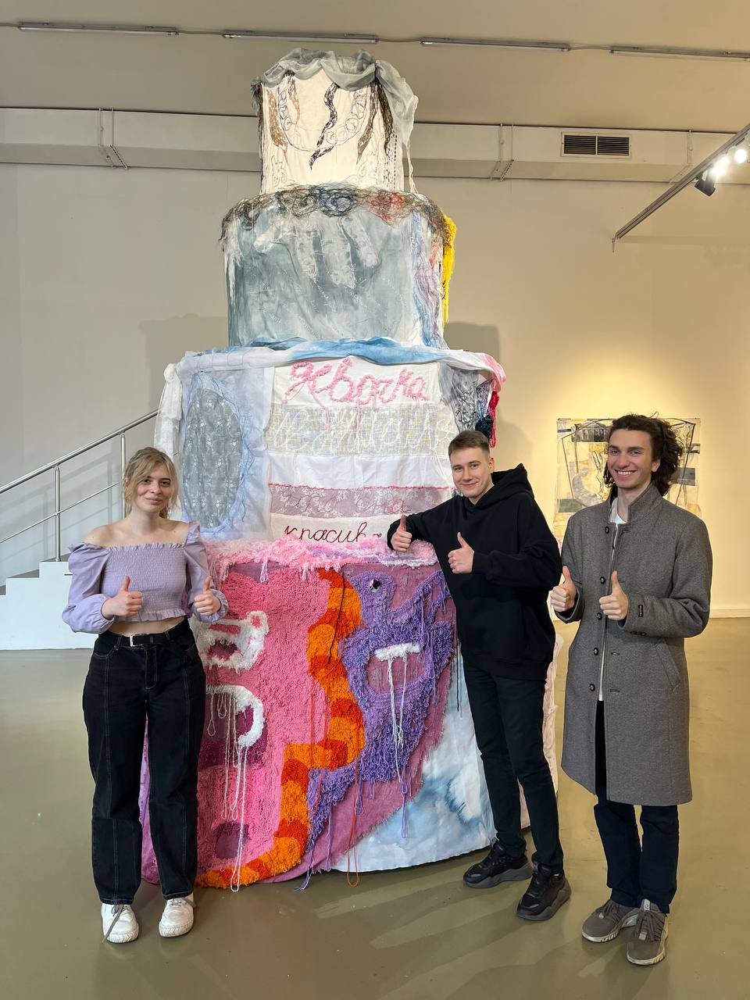

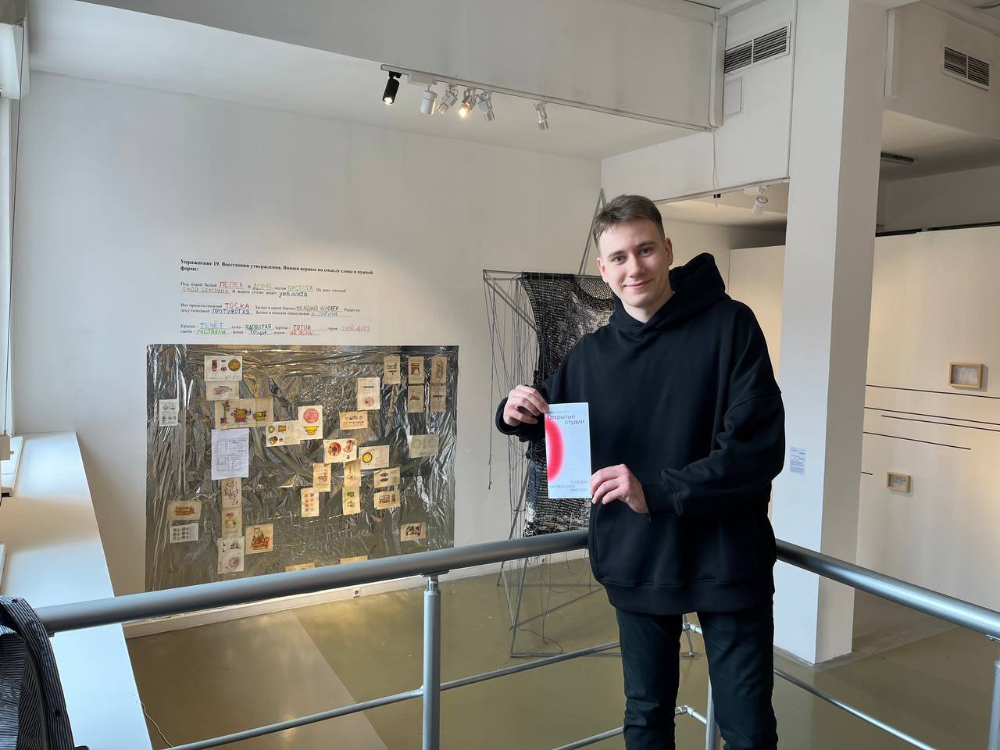

In [ ]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻